In [1]:
using PyCall
using Soss
using Statistics
using Stheno
using Stheno: Kernel
using Optim
using LombScargle
using Plots
using PyPlot
using Zygote

Unable to init server: Could not connect: Connection refused
Unable to init server: Could not connect: Connection refused

(.:314): Gdk-CRITICAL **: 10:36:03.379: gdk_cursor_new_for_display: assertion 'GDK_IS_DISPLAY (display)' failed

(.:314): Gdk-CRITICAL **: 10:36:03.392: gdk_cursor_new_for_display: assertion 'GDK_IS_DISPLAY (display)' failed


In [2]:
kplr = pyimport("kplr")

# The ID of a star from the Kepler Input Catalog
KIC_ID = 1430163

# Attaching the kplr API
client = kplr.API()

# Getting the star data
star = client.star(KIC_ID)

# Time values
tₐ = Vector{Float64}()

# Pre-search Data Conditioning Simple Aperture Photometry (PDCSAP) flux values
fₐ = Vector{Float32}()

# The 1-sigma errors in PDC flux values
fσₐ = Vector{Float32}()

# Getting long cadence data of light curves
for lc in star.get_light_curves(short_cadence = false)

    # Reading data from a light curve
    data = lc.read()
    
    t₀ = get(data, "TIME")
    f₀ = get(data, "PDCSAP_FLUX")
    fσ₀ = get(data, "PDCSAP_FLUX_ERR")

    # Creating a mask for only qualitative data points
    mask = (get(data, "SAP_QUALITY") .== 0) .& isfinite.(t₀) .& isfinite.(f₀)
    
    append!(tₐ, t₀[mask])
    append!(fₐ, f₀[mask])
    append!(fσₐ, fσ₀[mask])

end

In [3]:
# Get access to rcParams
rcP = PyPlot.PyDict(PyPlot.matplotlib."rcParams")

# Set DPI
rcP["savefig.dpi"] = 300
rcP["figure.dpi"] = 300

# Activate TeX support
rcP["text.usetex"] = true

# Activate languages support
rcP["text.latex.preamble"] = raw"\usepackage[main=english]{babel}"

# Switch to Computer Modern font set
rcP["mathtext.fontset"] = "cm"

# Set font sizes
rcP["font.size"] = 18
rcP["legend.fontsize"] = 12;

color = "#425378";

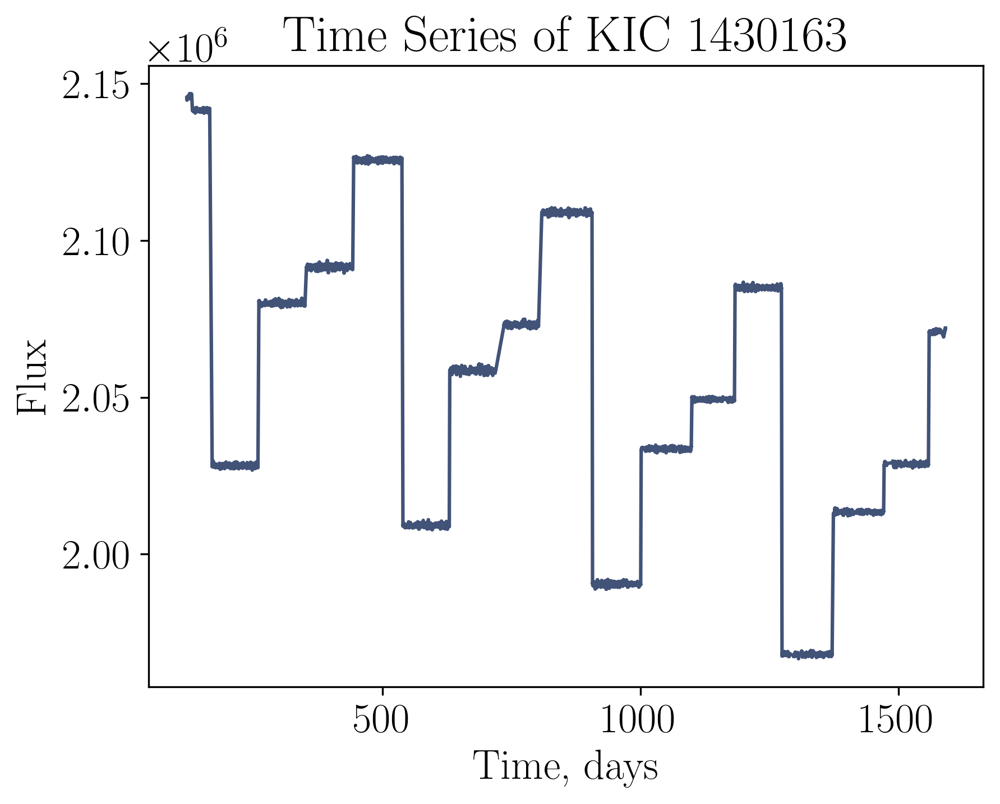

In [4]:
PyPlot.plot(tₐ, fₐ, color)

xlabel(L"\textrm{Time, days}")
ylabel(L"\textrm{Flux}")
title(latexstring("\\textrm{Time Series of KIC $KIC_ID}"))

PyPlot.savefig(joinpath("figures", "TS.pdf"), bbox_inches = "tight")

In [5]:
mask = (tₐ .≥ 443.5105) .& (tₐ .≤ 537.5502295)

tₘ = tₐ[mask]
const t = tₘ .- mean(tₘ)
const f = fₐ[mask]
const fσ = fσₐ[mask]

pad = 30

# Printing the size of the subset
println(rpad("Size of the subset:", pad), size(t, 1))

# Printing the mean of the flux
const μ₀ = mean(f)
println(rpad("Mean of the flux: ", pad), μ₀)
println(rpad("Log of this mean: ", pad), log(μ₀))

# Printing the variance of the subset
const σ²₀ = var(f)
println(rpad("Variance of the subset: ", pad), σ²₀)
println(rpad("Log of this variance: ", pad), log(σ²₀))

# Calculating the mean of the time differences between observations
Δt = []
for i in range(2, size(t, 1), step = 1)
    push!(Δt, t[i] - t[i-1])
end
Δμ = sum(Δt) / size(Δt, 1)
    
# Printing the mean of the time differences
println(rpad("Mean of the time differences:", pad), Δμ)
println(rpad("Log of this mean:", pad), log(Δμ))
println(rpad("1 / Log of this mean:", pad), 1 / log(Δμ))

Size of the subset:           3518
Mean of the flux:             2.125678e6
Log of this mean:             14.569601
Variance of the subset:       209401.33
Log of this variance:         12.2520075
Mean of the time differences: 0.026616617260856176
Log of this mean:             -3.626219549189213
1 / Log of this mean:         -0.2757692926297279


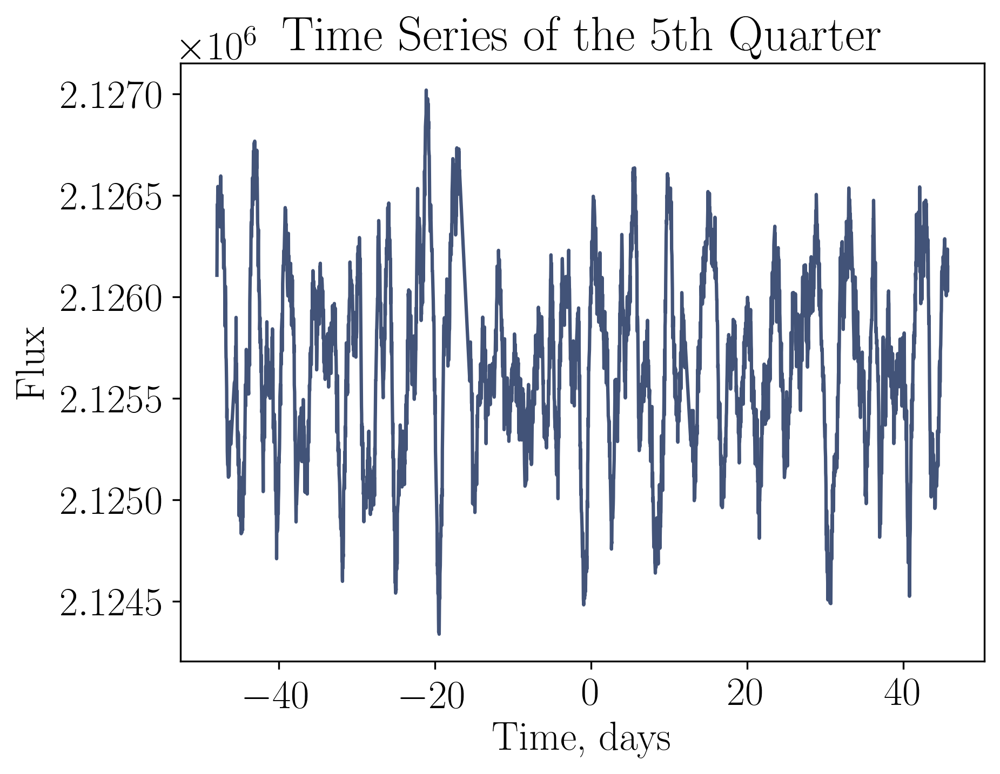

In [6]:
# Plotting the data
PyPlot.plot(t, f, color)

# Setting labels
xlabel(L"\textrm{Time, days}")
ylabel(L"\textrm{Flux}")

# Setting title
title(L"\textrm{Time Series of the 5th Quarter}")

# Saving the figure
PyPlot.savefig("figures/TS_5.pdf", bbox_inches = "tight")

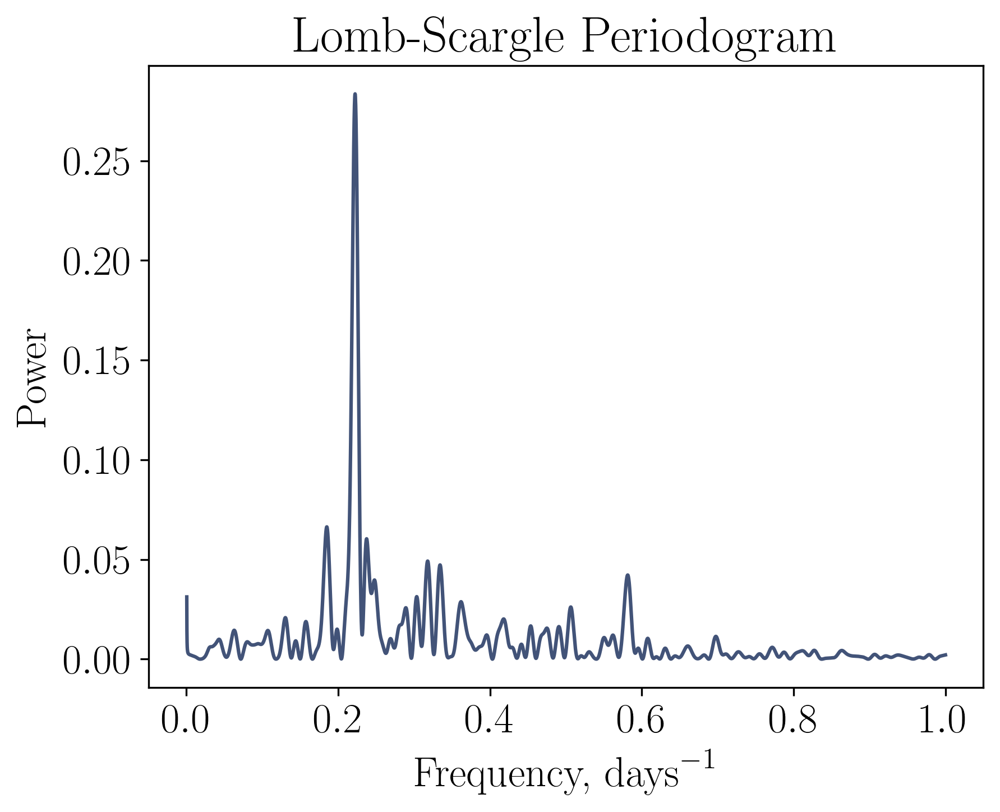

The peak is at 0.2222990081813975.
The relevant estimate of the period is 4.498445621421726.


In [7]:
frequencies = range(1 / size(t, 1) + 0.0003, 1.0; length = 5000)
plan = LombScargle.plan(t, f, fσ; frequencies)

p = lombscargle(plan)
freq, power = freqpower(p)
peak = findmaxfreq(p)
period = 1 / peak[1]

println("The peak is at $(peak[1]).")
println("The relevant estimate of the period is $period.")

PyPlot.plot(freq, power; color)

title(L"\textrm{Lomb-Scargle Periodogram}")
xlabel(L"\textrm{Frequency, days}^{-1}")
ylabel(L"\textrm{Power}")

PyPlot.savefig("figures/LSP.pdf", bbox_inches = "tight")

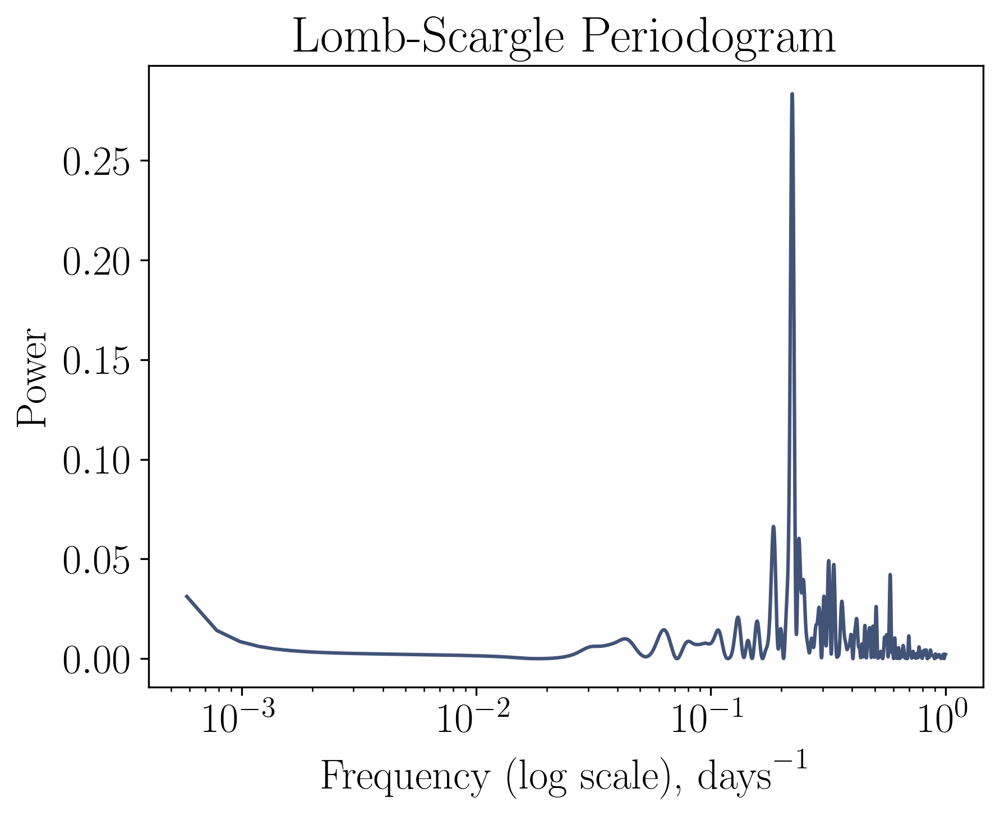

In [8]:
PyPlot.plot(freq, power; color)

title(L"\textrm{Lomb-Scargle Periodogram}")
xlabel(L"\textrm{Frequency (log scale), days}^{-1}")
ylabel(L"\textrm{Power}")
xscale("log")

PyPlot.savefig("figures/LSP (log).pdf", bbox_inches = "tight")

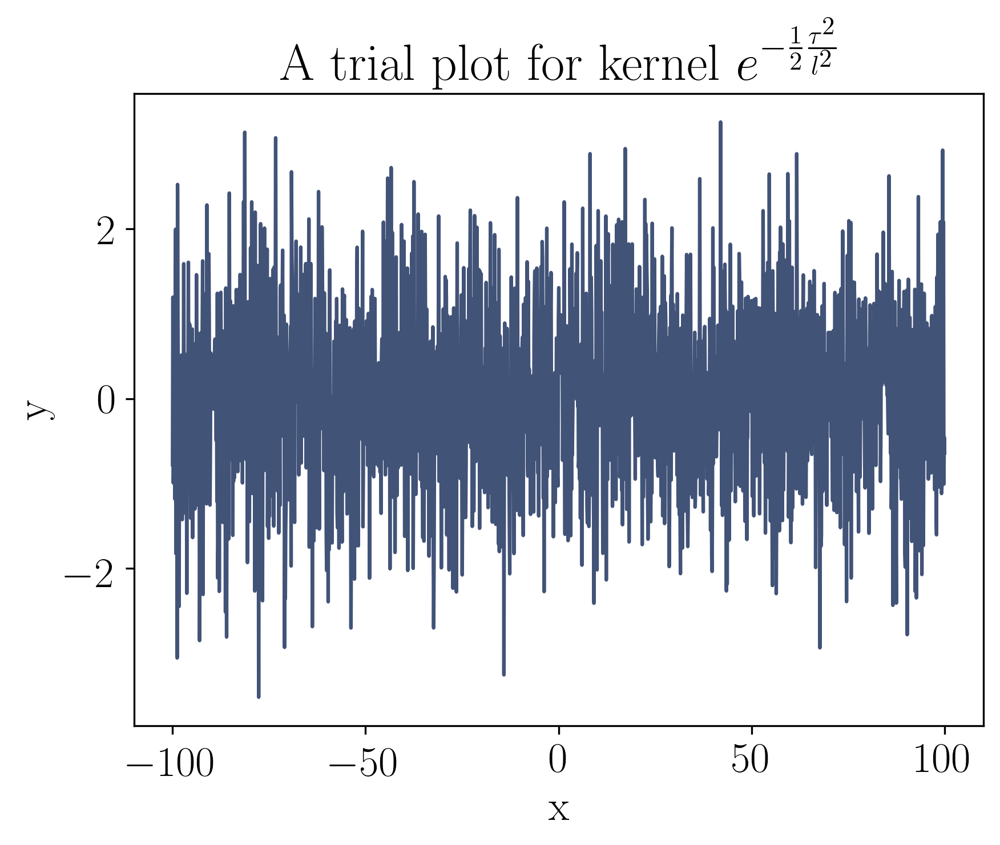

In [9]:
lₜ = 0.04

g = GP(stretch(Stheno.EQ(), 1 / lₜ^2), GPC())

x = range(-100, 100; length = 2000)
y = rand(g(x, 0.1))

PyPlot.plot(x, y; color)

title(L"\textrm{A trial plot for kernel } e^{-\frac{1}{2}\frac{\tau^2}{l^2}}")
xlabel(L"\textrm{x}")
ylabel(L"\textrm{y}")

PyPlot.savefig("figures/EQ.pdf", bbox_inches = "tight")

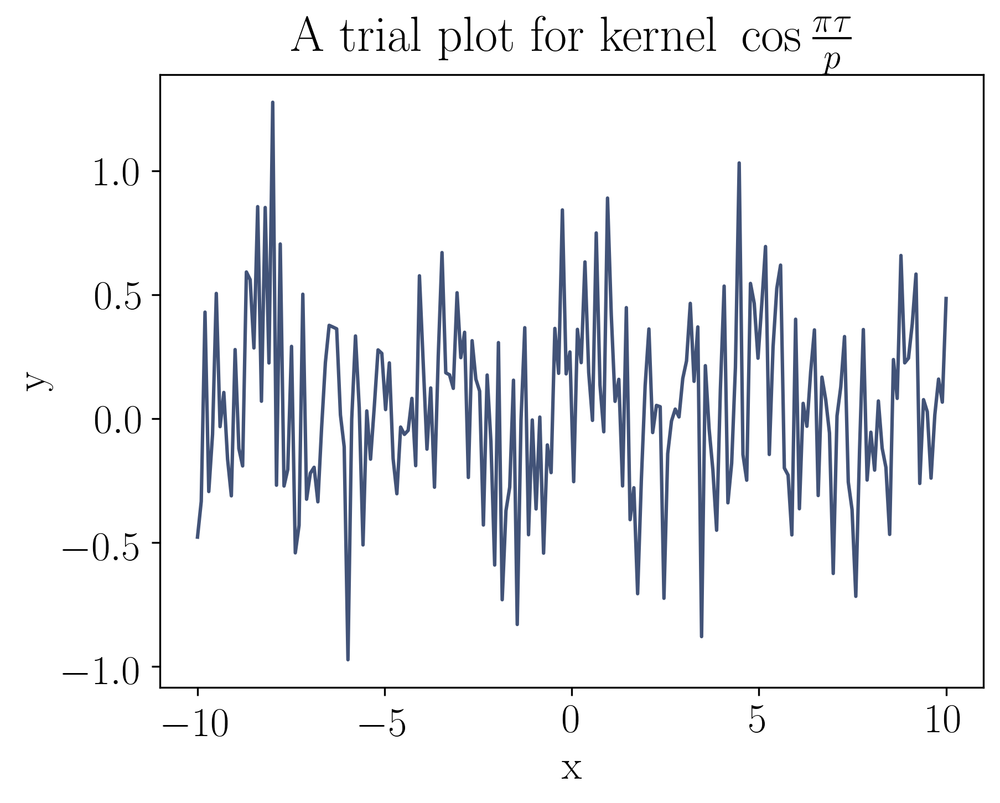

In [10]:
g = GP(Stheno.Cosine(period / 2), GPC())

x = range(-10, 10; length = 200)
y = rand(g(x, 0.1))

PyPlot.plot(x, y; color)

title(L"\textrm{A trial plot for kernel } \cos\frac{\pi \tau}{p}")
xlabel(L"\textrm{x}")
ylabel(L"\textrm{y}")

PyPlot.savefig("figures/Cosine.pdf", bbox_inches = "tight")

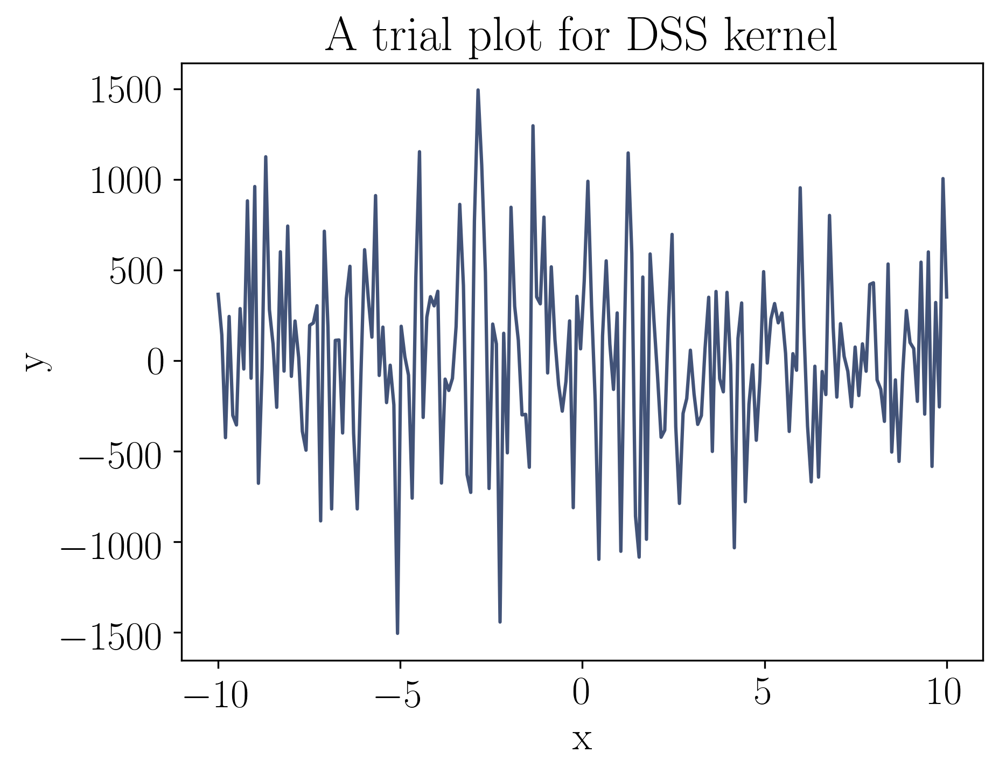

In [11]:
Aₜ = σ²₀
lₜ = 0.04

DSS = Aₜ * stretch(Stheno.EQ(), 1 / lₜ^2) * Stheno.Cosine(period / 2)

g = GP(DSS, GPC())

x = range(-10, 10; length = 200)
y = rand(g(x, 0.1))

PyPlot.plot(x, y; color)

title(L"\textrm{A trial plot for DSS kernel}")
xlabel(L"\textrm{x}")
ylabel(L"\textrm{y}")

PyPlot.savefig("figures/DSS.pdf", bbox_inches = "tight")

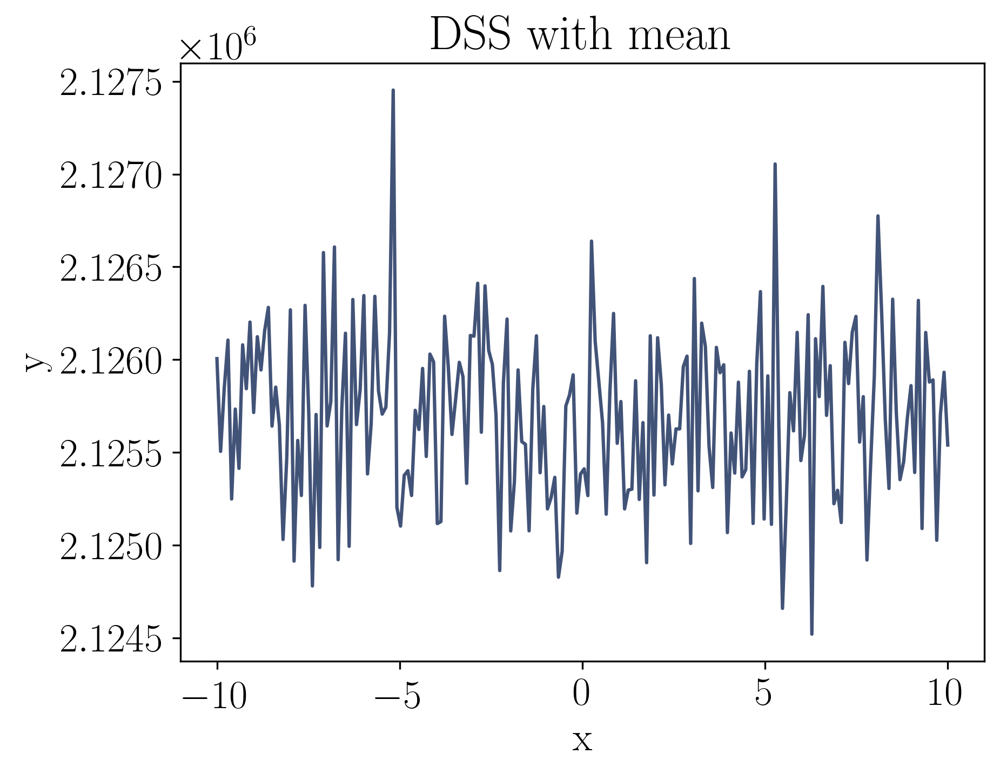

In [12]:
g = GP(μ₀, DSS, GPC())

x = range(-10, 10; length = 200)
y = rand(g(x, 0.1))

PyPlot.plot(x, y; color)

title(L"\textrm{DSS with mean}")
xlabel(L"\textrm{x}")
ylabel(L"\textrm{y}")

PyPlot.savefig("figures/DSS (with mean).pdf", bbox_inches = "tight")

In [13]:
# M = @model t begin
#     Aₛ ~ Normal(0, 1)
#     aₛ ~ Normal(0, 1)
#     periodₛ ~ Normal(0, 1)
#     g = Stheno.GP(Aₛ * EQC(aₛ) * Stheno.Cosine(periodₛ / 2), Stheno.GPC())
#     f ~ g(t, 0.05)
#     end;

In [14]:
# form = xform(M(t=t), (f=f,))

# function ℓπ(θ)
#     (θ_, logjac) = Soss.transform_and_logjac(form, θ)
#     return logpdf(M(t=t), merge(θ_, (f=f,))) + logjac
# end

# nlj(θ) = -ℓπ(θ);

In [15]:
# # # Hack to make Zygote play nicely with a particular thing in Distributions.
# Zygote.@nograd Distributions.insupport

# # Point estimate of parameters via BFGS.
# θ₀ = [0.03782039385618707, 27.800588611994993, 4.025972513638813]
# # θ₀ = randn(5)
# results = Optim.optimize(nlj, θ->first(gradient(nlj, θ)), θ₀, BFGS(); inplace = false)
# θ, _ = Soss.transform_and_logjac(form, results.minimizer)

In [16]:
function unpack(θ)
    A = θ[1]
    l = θ[2]
    P = θ[3]
    μ = θ[4]
    σ² = θ[5]
    return A, l, P, μ, σ²
end

function nlml(θ)
    A, l, P, μ, σ² = unpack(θ)
    k = A * stretch(EQ(), 1 / l^2) * Stheno.Cosine(P / 2)
    g = GP(μ, k, GPC())
    return -logpdf(g(t, σ²), f)
end

nlml (generic function with 1 method)

In [185]:
# θ₀ = [0.03782039385618707, 27.800588611994993, 4.025972513638813, 0.1]
# θ₀ = [0.03782039385618707, 27.800588611994993, 4.025972513638813]
# results = Optim.optimize(nlml, θ₀, NelderMead())

# θ₀ = [0.03782039385618707, 27.800588611994993, 4.025972513638813, 0.1]
# θ₀ = [1, 1/2, period / 2]
θ₀ = [σ²₀, 0.55, 3.88, μ₀, 6000]
θₗ = [209000.0, 0.45, 3.0, 2125650.0, 5950.0]
θᵤ = [210000.0, 0.7, 4.5, 2125750.0, 6050.0]
results = Optim.optimize(
    nlml,
    θ->Zygote.gradient(nlml, θ)[1],
    θₗ,
    θᵤ,
    θ₀,
    Fminbox(LBFGS()),
    Optim.Options(
        iterations = 10,
        show_trace = true,
        extended_trace = true,
        store_trace = false,
    );
    inplace = false,
)

Fminbox
-------
Initial mu = 0.0205539

Fminbox iteration 1
-------------------
Calling inner optimizer with mu = 0.0205539

(numbers below include barrier contribution)
Iter     Function value   Gradient norm 
     0     2.119242e+04     3.998282e+02
 * Current step size: 1.0
 * time: 0.0005290508270263672
 * g(x): [0.00013976047838235305, 399.8282216657727, -1.0873415027399378, 0.003565983494533929, -0.0024801570797695696]
 * x: [209401.328125, 0.55, 3.88, 2.125678e6, 6000.0]
     1     2.118634e+04     1.294103e+01
 * Current step size: 0.00028793417946751355
 * time: 181.7891490459442
 * g(x): [0.0002221468440328038, 12.941032637195681, -4.474617097632583, 0.0037150532062529013, 0.007061735604336403]
 * x: [209401.32812495975, 0.5209934034787261, 3.8802898882940404, 2.125677999998973e6, 6000.000000714111]
     2     2.118435e+04     1.696731e+01
 * Current step size: 0.14377606324365522
 * time: 547.1100471019745
 * g(x): [0.00022335871275657492, -16.967310814596907, -0.23341407161

LoadError: InterruptException:

In [47]:
Aᵣ, lᵣ, Pᵣ = unpack(results.minimizer);

kᵣ = Aᵣ * stretch(Stheno.EQ(), 1 / lᵣ^2) * Stheno.Cosine(Pᵣ / 2);
g = GP(μ₀, kᵣ, GPC());
gₚ = g | Obs(g(t, 0.05), f);

plt = Plots.plot()
plot!(plt, gₚ(t); samples=10, label="", color=:blue);
display(plt)

┌ Warning: Attribute alias `width` detected in the user recipe defined for the signature (::Stheno.FiniteGP{Stheno.CompositeGP{Tuple{typeof(|),GP{Stheno.ConstMean{Float32},Stheno.Product{Stheno.Scaled{Array{Float64,1},Stheno.Stretched{Array{Float64,1},EQ,typeof(identity)},typeof(identity)},Stheno.Cosine{Array{Float64,1},typeof(identity)}}},LinearAlgebra.Cholesky{Float64,Array{Float64,2}},Array{Float64,1},Stheno.FiniteGP{GP{Stheno.ConstMean{Float32},Stheno.Product{Stheno.Scaled{Array{Float64,1},Stheno.Stretched{Array{Float64,1},EQ,typeof(identity)},typeof(identity)},Stheno.Cosine{Array{Float64,1},typeof(identity)}}},Array{Float64,1},LinearAlgebra.Diagonal{Float64,FillArrays.Fill{Float64,1,Tuple{Base.OneTo{Int64}}}}},Array{Float32,1}}},Array{Float64,1},LinearAlgebra.Diagonal{Float64,FillArrays.Fill{Float64,1,Tuple{Base.OneTo{Int64}}}}}). To ensure expected behavior it is recommended to use the default attribute `linewidth`.
└ @ Plots /home/paveloom/.julia/packages/Plots/ViMfq/src/pipelin

In [23]:
using LinearAlgebra

In [21]:
θ₀ = [0.03782039385618707, 27.800588611994993, 4.025972513638813 / 2]
g = Stheno.GP(θ₀[1] * EQC(θ₀[2]) * Stheno.Cosine(θ₀[3]), Stheno.GPC())

matrix = cov(g(t, 0.05))

3518×3518 Array{Float64,2}:
 0.0878204   0.0373649   0.036031   …  0.0         0.0         0.0
 0.0373649   0.0878204   0.0373649     0.0         0.0         0.0
 0.036031    0.0373649   0.0878204     0.0         0.0         0.0
 0.0339126   0.036031    0.0373649     0.0         0.0         0.0
 0.0311543   0.0339126   0.036031      0.0         0.0         0.0
 0.0279346   0.0311543   0.0339126  …  0.0         0.0         0.0
 0.0244473   0.0279346   0.0311543     0.0         0.0         0.0
 0.0208823   0.0244473   0.0279346     0.0         0.0         0.0
 0.0174091   0.0208823   0.0244473     0.0         0.0         0.0
 0.0141651   0.0174091   0.0208823     0.0         0.0         0.0
 0.0112487   0.0141651   0.0174091  …  0.0         0.0         0.0
 0.00871785  0.0112487   0.0141652     0.0         0.0         0.0
 0.00659375  0.00871784  0.0112487     0.0         0.0         0.0
 ⋮                                  ⋱  ⋮                       
 0.0         0.0         0.0         

In [24]:
isposdef(matrix)

true

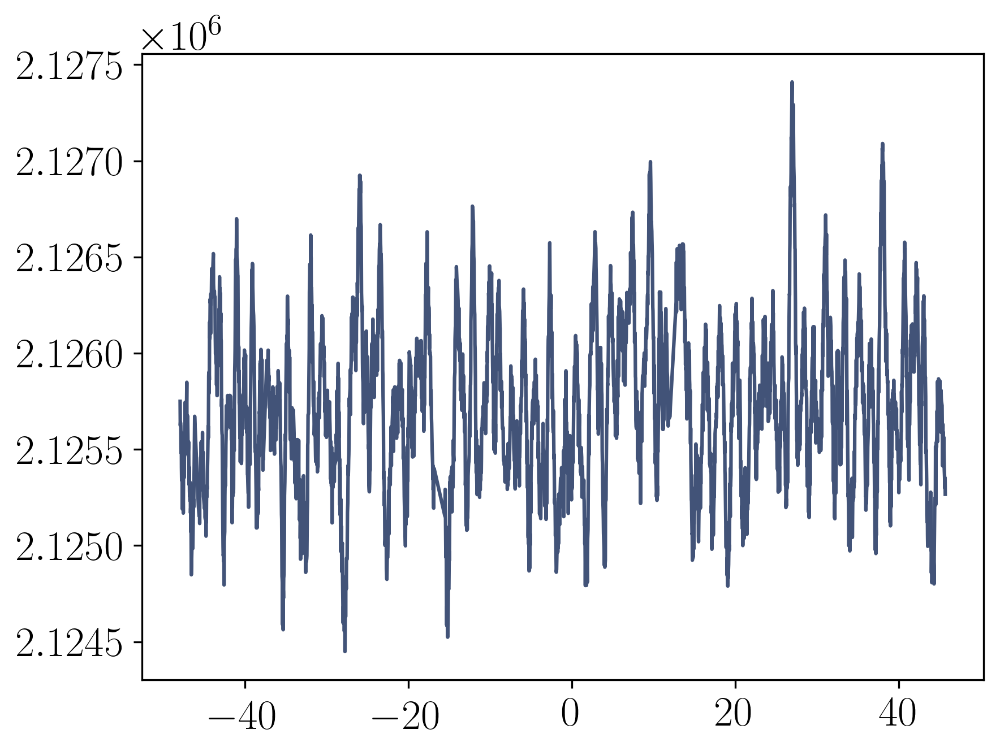

21192.89377199526


1-element Array{PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7f6188c60580>

In [179]:
θₜ = [209401.23928068715, 0.55, 3.88, 2.125677794326631e6, 6000]
println(nlml(θₜ))

g = Stheno.GP(θₜ[4], θₜ[1] * stretch(EQ(), 1 / θₜ[2]^2) * Stheno.Cosine(θₜ[3] / 2), Stheno.GPC())

x = t
y = rand(g(x, θₜ[5]))

PyPlot.plot(x, y; color)

In [181]:
P = range(2, 10; step = 0.1)
for (i, Pᵢ) in enumerate(P)
    θₜ = [209401.23928068715, 0.55, Pᵢ, 2.125677794326631e6, 6000]
    g = Stheno.GP(θₜ[4], θₜ[1] * stretch(EQ(), 1 / θₜ[2]^2) * Stheno.Cosine(θₜ[3] / 2), Stheno.GPC())
    println(Pᵢ, " "^3, -logpdf(g(t, θₜ[5]), f))
end

2.0   21220.748207337296
2.1   21216.04344851742
2.2   21212.111958993148
2.3   21208.81561845265
2.4   21206.04532580988
2.5   21203.713729221185
2.6   21201.750101982776
2.7   21200.09663351637
2.8   21198.705685165492
2.9   21197.537722653396
3.0   21196.55973435347
3.1   21195.74400518454
3.2   21195.067155118584
3.3   21194.509377371873
3.4   21194.053829168974
3.5   21193.68614039482
3.6   21193.394014270074
3.7   21193.166900537974
3.8   21192.9957262864
3.9   21192.872672948615
4.0   21192.790990582413
4.1   21192.744842445627
4.2   21192.729174355423
4.3   21192.739604434995
4.4   21192.772329726704
4.5   21192.8240468234
4.6   21192.891884207882
4.7   21192.97334440895
4.8   21193.06625442236
4.9   21193.16872311287
5.0   21193.27910453489
5.1   21193.395966283275
5.2   21193.51806213362
5.3   21193.64430834932
5.4   21193.77376312938
5.5   21193.90560875459
5.6   21194.039136054864
5.7   21194.17373087885
5.8   21194.308862292768
5.9   21194.444072275386
6.0   21194.57896671

In [180]:
σ² = range(6000, 7000; step = 10)
for (i, σ²ᵢ) in enumerate(σ²)
    θₜ = [209401.23928068715, 0.55, 3.88, 2.125677794326631e6, σ²ᵢ]
    g = Stheno.GP(θₜ[4], θₜ[1] * stretch(EQ(), 1 / θₜ[2]^2) * Stheno.Cosine(θₜ[3] / 2), Stheno.GPC())
    println(σ²ᵢ, " "^3, -logpdf(g(t, θₜ[5]), f))
end

6000   21192.89377199526
6010   21192.871122543194
6020   21192.852758366884
6030   21192.838651445254
6040   21192.828773964407
6050   21192.82309831539
6060   21192.821597092785
6070   21192.82424309299
6080   21192.831009312045
6090   21192.841868944193
6100   21192.85679538002
6110   21192.875762204996
6120   21192.89874319754
6130   21192.925712327233
6140   21192.956643753583
6150   21192.99151182401
6160   21193.030291072537
6170   21193.07295621784
6180   21193.119482161925
6190   21193.169843988297
6200   21193.22401696101
6210   21193.281976522107
6220   21193.343698291137
6230   21193.40915806298
6240   21193.478331806567
6250   21193.55119566352
6260   21193.627725946233
6270   21193.70789913717
6280   21193.791691886752
6290   21193.87908101221
6300   21193.97004349613
6310   21194.06455648524
6320   21194.162597288665
6330   21194.264143376822
6340   21194.369172380102
6350   21194.47766208736
6360   21194.589590444717
6370   21194.70493555414
6380   21194.823675672164
63